<a href="https://colab.research.google.com/github/julianoliveira600/Tensorkerasalura/blob/main/TensorkeraTCC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
url = '/content/drive/MyDrive/TCC/ultimozip/Base de dados de HI Pets'

import pathlib: importa a biblioteca pathlib, que é a forma moderna no Python de lidar com caminhos de arquivos e pastas.

In [2]:
import pathlib


data_dir = pathlib.Path(url): Cria uma variável data_dir, que "aponta" para a pasta principal do TCC no Google Drive.

In [3]:
data_dir = pathlib.Path(url)

Entra na pasta data_dir.

Olha dentro de qualquer subpasta (*).

Encontra qualquer arquivo que termine com .jpg (*.jpg).

Conta quantos foram encontradas.

Resultado (Output 592): Confirmado que tem 592 imagens no total.

In [4]:
len(list(data_dir.glob('*/*.jpg')))

592

Listou os nomes das subpastas (benign, malignant), confirmando duas classes.

In [5]:
subfolders = [f.name for f in data_dir.iterdir() if f.is_dir()]
subfolders

['benign', 'malignant']

In [6]:
  import PIL

Criou uma lista em Python contendo o caminho de todas as imagens que estão apenas dentro da pasta benign.

In [7]:
benigno = list(data_dir.glob('benign/*'))

Biblioteca PIL (Pillow) para abrir e exibir a primeira imagem (benigno[0]) dessa lista.

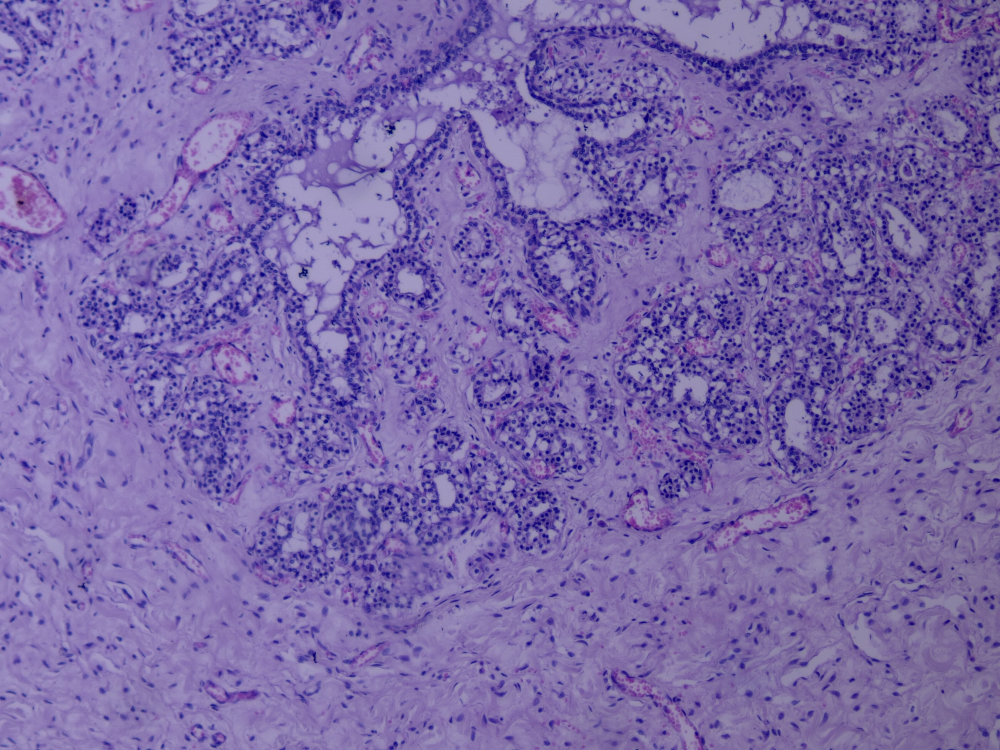

In [8]:
PIL.Image.open(str(benigno[0]))

Importou a biblioteca numpy, que é essencial para processamento numérico. Utilizamos aqui para converter a imagem em um "array" (matriz de números) para ver seu formato.

In [9]:
import numpy as np

Iniciou um loop que executa o bloco de código duas vezes:
Primeira vez: com subfolder = 'benign'
Segunda vez: com subfolder = 'malignant'
*   Listou todas as imagens .jpg dentro da subpasta atual (benign ou malignant).
*   print(f'Classe {subfolder} ...'): Imprimi a contagem de imagens para aquela classe.

*   img = PIL.Image.open(...): Abriu a primeira imagem da lista daquela classe.
*   img_array = np.array(img): Converteu a imagem (que o PIL vê como um objeto) em um array NumPy.
print(f'... {img_array.shape}'): Imprimiu o "formato" (shape) desse array.
(1944, 2592, 3) significa: 1944 pixels de altura, 2592 pixels de largura e 3 canais de cor (Vermelho, Verde, Azul).










In [10]:
for subfolder in subfolders:
  path = data_dir / subfolder
  images = list(path.glob('*.jpg'))
  print(f'Classe {subfolder} tem {len(images)} imagens')

  if images:
    img = PIL.Image.open(str(images[0]))
    img_array = np.array(img)
    print(f'Dimensões da primeira imagem em {subfolder}: {img_array.shape}')

Classe benign tem 220 imagens
Dimensões da primeira imagem em benign: (1944, 2592, 3)
Classe malignant tem 372 imagens
Dimensões da primeira imagem em malignant: (1944, 2592, 3)


Este é um dos blocos mais importantes. Você está usando uma função muito poderosa do Keras para carregar e pré-processar as imagens automaticamente.

*   import tensorflow as tf: Importou a biblioteca principal de deep learning, o TensorFlow.
*   batch_size = 64: Definiu uma variável. Em vez de treinar o modelo com uma imagem de cada vez (lento) ou todas as 474 de uma vez (impossível, sem memória), nós o treinaremos em "lotes" (grupos) de 64 imagens.


*   altura = 256, largura = 256: Definimos o tamanho-alvo. Esta é a solução para o problema que vimos na Célula 2 (imagens gigantes).
*  treino = tf.keras.utils.image_dataset_from_directory(...): Esta é a função principal. Você pediu a ela para:

*   data_dir: Olhar na sua pasta principal. Ela automaticamente entende que benign e malignant são as duas classes.
*   validation_split=0.2: Reservar 20% de todas as 592 imagens para um conjunto de validação (teste).
*   subset='training': Especificar que esta variável, treino, deve conter os 80% restantes (o conjunto de treino).  


*   O validation_split=0.2 não separa 20% para treino. Ele faz o seguinte:
    1.   Ele primeiro divide 100% dos seus dados (592 imagens) em duas partes:
    - Uma parte de 20% (para validação).
    - Uma parte de 80% (para treino).

    2.   Depois, o parâmetro subset='training' diz: "Para esta variável treino, por favor, me entregue a parte de 80% (o conjunto de treino)"
    *   Por isso o resultado foi: Using 474 files for training. (Que é 80% de 592).  

    *   Na sua próxima célula, quando você criar a variável validacao, você vai usar subset='validation', e ela vai pegar a outra parte (os 20% restantes).

*   seed=568: Usar um número fixo (uma "semente") para a divisão aleatória. Isso garante que, se você rodar o código de novo, a divisão 80/20 será exatamente a mesma.

Imagine que suas 592 imagens são 592 cartas de baralho, e você precisa dividi-las aleatoriamente em dois montes:

Um monte de treino (80%, 474 cartas)

Um monte de validação (20%, 118 cartas)

Para fazer isso, você precisa embaralhar as cartas antes de dividir.

O Problema do "Aleatório Puro"
Se você simplesmente embaralhar as cartas (sem um seed), cada vez que você fizer isso, a ordem será diferente.

Na primeira vez: A "Rainha de Copas" pode cair no monte de treino.

Na segunda vez: Você embaralha de novo, e a "Rainha de Copas" cai no monte de validação.

Isso é um problema para o seu TCC. Por quê? Porque se você treinar seu modelo hoje e ele tiver 95% de precisão, e amanhã você rodar o código de novo (com uma ordem de cartas diferente) e ele tiver 90% de precisão, você não saberá o porquê. A culpa foi do modelo? Ou foi porque o conjunto de validação ficou "mais difícil" dessa vez?

A Solução: A "Semente" (Seed)
O seed resolve isso. Um computador não gera aleatoriedade "de verdade" (como um dado). Ele gera uma "pseudo-aleatoriedade": uma sequência de números que parece aleatória, mas que é 100% baseada em um número inicial (a "semente").

Pense no seed=568 como uma "instrução de embaralhamento" específica.

seed=568 diz ao computador: "Embaralhe as 592 imagens usando o método de embaralhamento número 568."

seed=123 diria: "Use o método de embaralhamento número 123."

Enquanto você mantiver seed=568, não importa quantas vezes você rode o código (hoje, amanhã ou daqui a um ano), o computador usará o exato mesmo método de embaralhamento nº 568.

Resultado: A "Rainha de Copas" (sua imagem benign[0], por exemplo) sempre cairá no mesmo monte (treino ou validação).

Resumo
O seed=568 garante a Reprodutibilidade Científica. Ele garante que seu conjunto de treino (474 imagens) e seu conjunto de validação (118 imagens) contenham exatamente as mesmas imagens toda vez que você executar o script. Isso permite que você mude seu modelo e compare os resultados de forma justa.

O número 568 em si é arbitrário. Você poderia ter escolhido 42, 1000, ou qualquer outro. O importante é que ele seja fixo.


*   image_size=(altura, largura): Esta é a mágica. Ela redimensiona automaticamente todas as imagens gigantes (1944x2592) para o tamanho gerenciável de (256, 256) no momento em que são carregadas.

*   batch_size=batch_size: Agrupar essas imagens de treino em lotes de 64.


  1.   No Treinamento
  É exatamente isso que o modelo faz:

  O Keras pega as primeiras 64 imagens do seu conjunto de treino.

  O modelo "olha" para todas as 64 e faz 64 previsões.

  Ele calcula o erro (o "custo" ou loss) para cada uma dessas 64 imagens.

  Ele tira a média desse erro.

  Ele usa essa "média de erro" para ajustar seus pesos (seu "cérebro") de forma estável.

  Em seguida, ele joga fora essas 64 imagens e pega as próximas 64.

  Isso é chamado de uma iteração ou passo (step).
2.   Item da lista









  

















In [11]:
  import tensorflow as tf

In [12]:
batch_size = 64
altura = 256
largura = 256

In [13]:
treino = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset = 'training',
    seed  = 568,
    image_size=(altura, largura),
    batch_size=batch_size
)

Found 592 files belonging to 2 classes.
Using 474 files for training.


In [14]:
validacao = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset = 'validation',
    seed  = 568,
    image_size=(altura, largura),
    batch_size=batch_size
)

Found 592 files belonging to 2 classes.
Using 118 files for validation.


In [15]:
treino.class_names

['benign', 'malignant']

Assim como o seed=568 garantiu que seus dados fossem embaralhados da mesma forma, o tf.random.set_seed(424242) garante que seu modelo comece da mesma forma.

Inicialização de Pesos: Quando você cria um modelo (especialmente camadas Dense e Conv2D), ele não sabe nada. Seus "neurônios" (pesos) são iniciados com valores pequenos e aleatórios.

Garantia de Reprodutibilidade: Ao definir um seed global (o número 424242 é arbitrário), você garante que toda vez que você rodar este script, os pesos iniciais do seu modelo serão exatamente os mesmos.

Isso elimina outra fonte de "sorte" do seu experimento. Se você treinar o modelo hoje e obtiver 90% de precisão, e treiná-lo amanhã, você quer ter certeza de que o resultado será o mesmo.

Correções necessárias: Nenhuma. Este é um passo importante para um bom TCC.

In [16]:
tf.random.set_seed(424242)

O Modelo (tf.keras.models.Sequential)
Você criou um modelo Sequential, que é o tipo mais simples de modelo: uma pilha linear de camadas, onde a saída de uma camada alimenta diretamente a entrada da próxima.
  


1.   tf.keras.layers.Input(shape=(256,256,3))
  O que faz? Define a "porta de entrada" do modelo.
Explicação: Diz ao modelo para esperar imagens que tenham 256 pixels de altura, 256 pixels de largura e 3 canais de cor (RGB). Isso bate perfeitamente com o image_size=(256, 256) que você definiu ao carregar os dados.

2.   tf.keras.layers.Rescaling(1./255)
  O que faz? Normaliza os dados.
  Explicação: As imagens são carregadas com valores de pixel de 0 (preto) a 255 (branco). Redes neurais funcionam muito mal com números tão grandes. Esta camada divide cada valor de pixel por 255, transformando o intervalo de [0, 255] para [0, 1]. É um passo de "limpeza" crucial.

3.   tf.keras.layers.Flatten()
  O que faz? "Achata" a imagem.
  Explicação: A camada anterior (Rescaling) ainda vê a imagem como um cubo 3D de dados (256 x 256 x 3). A camada Flatten destrói essa estrutura 3D e a "desenrola" em um único vetor 1D gigante.
  Cálculo: $256 \times 256 \times 3 = \text{196.608}$. Esta camada transforma sua imagem em uma linha única com 196.608 números.
4.   tf.keras.layers.Dense(128, activation=tf.nn.relu)
  O que faz? A primeira camada "inteligente" (Densa).
  Explicação: Esta é uma camada de neurônios totalmente conectada.
  Dense(128): Significa que ela tem 128 neurônios (ou "nós").
  Conexão: Ela conecta cada um dos 196.608 neurônios da camada Flatten a cada um dos seus 128 neurônios.
  activation='relu': É a "função de ativação". ReLU é um interruptor simples: se a entrada for negativa, ele solta 0; se for positiva, ele solta a própria entrada. Isso ajuda o modelo a aprender padrões complexos.

5.   tf.keras.layers.Dense(2, activation=tf.nn.softmax)
  O que faz? A camada de "saída" ou "classificação".
  Explicação:
  Dense(2): Tem 2 neurônios, um para cada classe (benign e malignant).
  activation='softmax': Esta é a função de ativação perfeita para classificação. Ela pega os valores brutos dos 2 neurônios e os converte em probabilidades que somam 100%. Por exemplo, a saída será algo como [0.1, 0.9], que significa: "10% de chance de ser benigno, 90% de chance de ser maligno."

  O que a Compilação Fez
  O modelo.compile() é a etapa de "configuração para o treinamento".
1.   optimizer=tf.keras.optimizers.Adam()
    - O que faz? Define o "Otimizador".

  Explicação: O otimizador é o motor que ajusta os pesos (parâmetros) do modelo para reduzir o erro. O "Adam" é o otimizador mais popular e recomendado: ele é eficiente e se ajusta automaticamente (ajusta a "taxa de aprendizado") durante o treino.

2.   loss = 'sparse_categorical_crossentropy'
  O que faz? Define a "Função de Perda" (ou Custo).
  Explicação: É a forma como o modelo mede seu erro.









  



In [17]:
modelo = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(256,256,3)),
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(2, activation=tf.nn.softmax)
])



1.   optimizer=tf.keras.optimizers.Adam()
  O que faz? Define o "Otimizador".

  Explicação: O otimizador é o motor que ajusta os pesos (parâmetros) do modelo para reduzir o erro. O "Adam" é o otimizador mais popular e recomendado: ele é eficiente e se ajusta automaticamente (ajusta a "taxa de aprendizado") durante o treino.

1.   loss = 'sparse_categorical_crossentropy'

  O que faz? Define a "Função de Perda" (ou Custo).

  Explicação: É a forma como o modelo mede seu erro.

  sparse_: Você usou "sparse" (esparso), o que está correto. Isso significa que seus labels (rótulos) são números inteiros (0 para benign, 1 para malignant). Se seus labels fossem [1, 0] e [0, 1] (one-hot), você usaria apenas categorical_crossentropy.

  categorical_crossentropy: É a fórmula matemática padrão para medir o quão "longe" a previsão (ex: [0.1, 0.9]) está da realidade (ex: 1).


1.   metrics = ['accuracy']
  O que faz? Define a "Métrica".
  Explicação: A "perda" (loss) é um número matemático difícil de interpretar (ex: 0.345). A "acurácia" (accuracy) é uma métrica fácil para humanos: a porcentagem de imagens que o modelo acertou. Você pediu ao modelo para reportar a acurácia em cada época.




In [18]:
modelo.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss = 'sparse_categorical_crossentropy',
  metrics = ['accuracy']
)

In [19]:
#device_name = tf.test.gpu_device_name()
#if device_name != 'device:GPU:0':
  #$raise SystemError('GPU device not found')

#print('Found GPU at {}'.format(device_name))



In [20]:
epocas = 10
history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 115s 14s/step - accuracy: 0.5241 - loss: 140.7217 - val_accuracy: 0.6356 - val_loss: 1.3531
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.5344 - loss: 1.0296 - val_accuracy: 0.6356 - val_loss: 0.6366
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.6064 - loss: 0.6455 - val_accuracy: 0.6356 - val_loss: 0.6267
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6321 - loss: 0.6281 - val_accuracy: 0.6356 - val_loss: 0.6294
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6244 - loss: 0.6343 - val_accuracy: 0.6356 - val_loss: 0.6302
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.6409 - loss: 0.6244 - val_accuracy: 0.6356 - val_loss: 0.6243
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6239 - loss: 0.6302 - val_accuracy: 0.6356 - val_loss: 0.6237
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6276 - loss: 0.6264 - val_accuracy: 0.6356 - val_loss: 0.6224
Epoc

In [21]:
modelo.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 196608)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    25,165,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 75,498,632 (288.00 MB)

 Trainable params: 25,166,210 (96.00 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 50,332,422 (192.00 MB)

In [22]:
import matplotlib.pyplot as plt

In [23]:
def plota_resultados(history,epocas):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  intervalo_epocas = range(epocas)
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.plot(intervalo_epocas, acc, label='Acurácia do Treino')
  plt.plot(intervalo_epocas, val_acc, label='Acurácia da Validação')
  plt.legend(loc='lower right')


  plt.subplot(1, 2, 2)
  plt.plot(intervalo_epocas, loss, label='Custo do Treino')
  plt.plot(intervalo_epocas, val_loss, label='Custo da Validação')
  plt.legend(loc='upper right')
  plt.show()

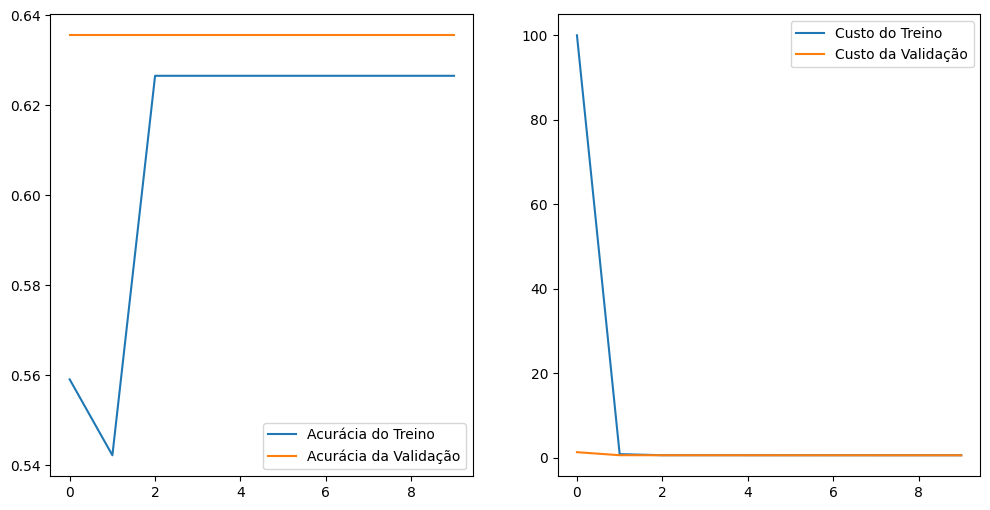

In [24]:
plota_resultados(history, epocas)

In [25]:
modelo = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(256,256,3)),
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.Conv2D(32, (3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(2, activation=tf.nn.softmax)
])

In [26]:
modelo.compile(optimizer=tf.keras.optimizers.Adam(),
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

In [27]:
epocas = 10
history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.5983 - loss: 7.2447 - val_accuracy: 0.6356 - val_loss: 1.3141
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.5641 - loss: 0.9093 - val_accuracy: 0.6356 - val_loss: 0.6346
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6175 - loss: 0.6167 - val_accuracy: 0.6186 - val_loss: 0.5364
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6770 - loss: 0.5543 - val_accuracy: 0.5339 - val_loss: 0.6670
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6588 - loss: 0.5744 - val_accuracy: 0.8305 - val_loss: 0.4668
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8070 - loss: 0.4558 - val_accuracy: 0.7034 - val_loss: 0.5369
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.8038 - loss: 0.4370 - val_accuracy: 0.9153 - val_loss: 0.3049
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.7448 - loss: 0.4675 - val_accuracy: 0.7373 - val_loss: 0.5469
Epoch 9/

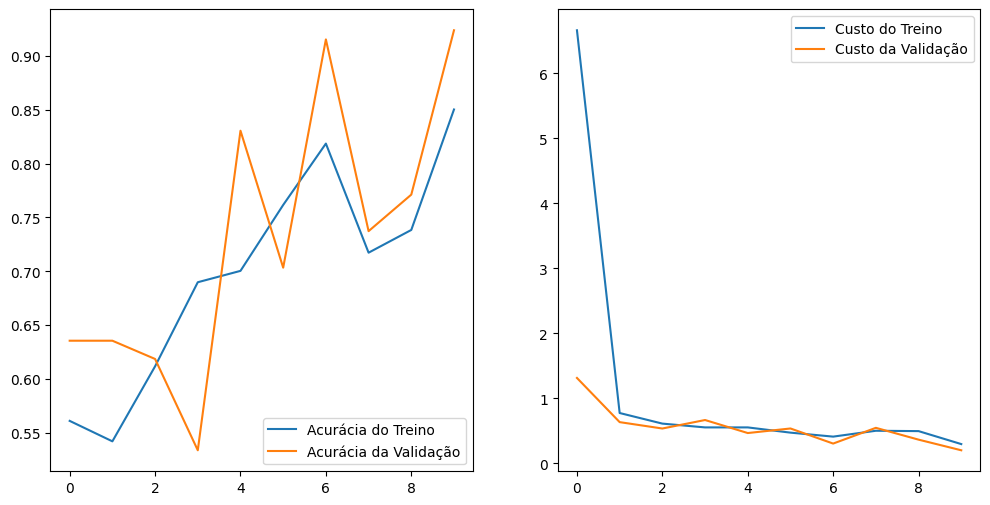

In [28]:
plota_resultados(history, epocas)

In [29]:
modelo.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 123008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │    15,745,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,266,664 (180.31 MB)

 Trainable params: 15,755,554 (60.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 31,511,110 (120.21 MB)

In [30]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy') >= 0.93):
      print("\n Alcançamos 93% de acurácia. Parando o treinamento!")
      self.model.stop_training = True

callbacks = myCallback()


In [31]:
modelo = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(256, 256, 3)),
    tf.keras.layers.Rescaling(1./255),
    # Add convolutions and max pooling
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(2, activation=tf.nn.softmax)
])

modelo.compile(optimizer = tf.keras.optimizers.Adam(),
              loss = 'sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [32]:
epocas = 10

history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
    callbacks=[callbacks]
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.5060 - loss: 4.6653 - val_accuracy: 0.6356 - val_loss: 0.7784
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.6536 - loss: 0.6830 - val_accuracy: 0.5763 - val_loss: 0.6387
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7188 - loss: 0.5174 - val_accuracy: 0.7034 - val_loss: 0.5241
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.7608 - loss: 0.5044 - val_accuracy: 0.8644 - val_loss: 0.3655
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.8532 - loss: 0.3321 - val_accuracy: 0.7458 - val_loss: 0.4498
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.8724 - loss: 0.3059 - val_accuracy: 0.8305 - val_loss: 0.3015
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.8948 - loss: 0.2539 - val_accuracy: 0.9576 - val_loss: 0.1733
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7236 - loss: 0.8136 - val_accuracy: 0.5508 - val_loss: 0.7086
Epoch 9/

In [33]:
modelo = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(256, 256, 3)),
    # data_augmentation,
    tf.keras.layers.Rescaling(1./255),
    # Add convolutions and max pooling
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(2, activation=tf.nn.softmax)
])

modelo.compile(optimizer = tf.keras.optimizers.Adam(),
              loss = 'sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [34]:
epocas = 50

history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.5384 - loss: 4.9818 - val_accuracy: 0.6356 - val_loss: 0.6868
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.5399 - loss: 0.7594 - val_accuracy: 0.6356 - val_loss: 0.6379
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6454 - loss: 0.6088 - val_accuracy: 0.6356 - val_loss: 0.5694
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.6150 - loss: 0.5658 - val_accuracy: 0.6864 - val_loss: 0.5673
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.7193 - loss: 0.5247 - val_accuracy: 0.8475 - val_loss: 0.4393
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.8471 - loss: 0.4362 - val_accuracy: 0.9153 - val_loss: 0.3544
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.8640 - loss: 0.3768 - val_accuracy: 0.9407 - val_loss: 0.2654
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9537 - loss: 0.2448 - val_accuracy: 0.8051 - val_loss: 0.3106
Epoch 9/

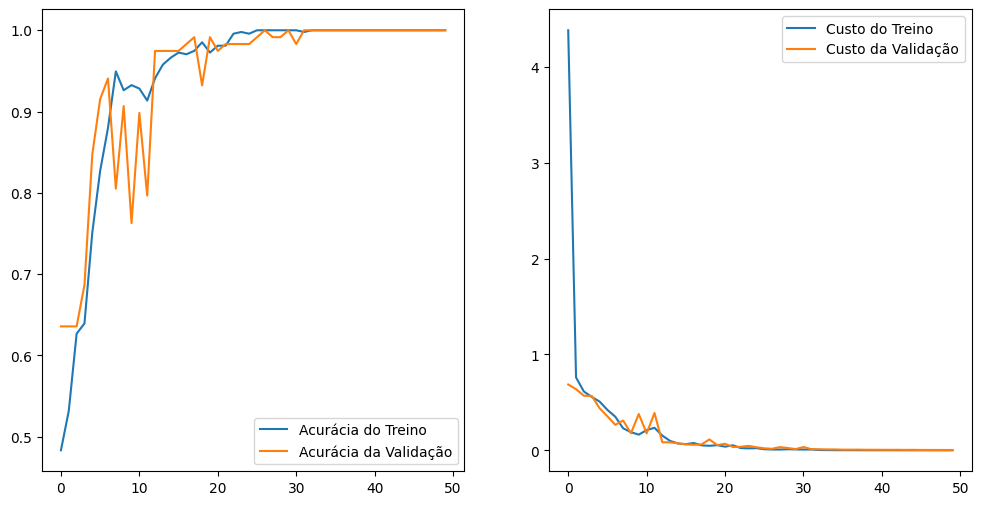

In [35]:
plota_resultados(history, epocas)

In [36]:
data_augmentation = tf.keras.Sequential([
     tf.keras.layers.RandomFlip('horizontal'),
     tf.keras.layers.RandomRotation(0.05),
     tf.keras.layers.RandomZoom(0.05)
])

In [37]:
modelo = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(256, 256, 3)),

    # data_augmentation,
    data_augmentation,
    tf.keras.layers.Rescaling(1./255),
    # Add convolutions and max pooling
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(2, activation=tf.nn.softmax)
])

modelo.compile(optimizer = tf.keras.optimizers.Adam(),
              loss = 'sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [38]:
epocas = 50

history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.5197 - loss: 7.7321 - val_accuracy: 0.6356 - val_loss: 0.6736
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.6363 - loss: 0.6287 - val_accuracy: 0.3729 - val_loss: 0.7540
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.5841 - loss: 0.6408 - val_accuracy: 0.5424 - val_loss: 0.6367
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.7230 - loss: 0.5581 - val_accuracy: 0.9576 - val_loss: 0.3933
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6844 - loss: 0.5098 - val_accuracy: 0.9831 - val_loss: 0.2752
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7787 - loss: 0.4000 - val_accuracy: 0.8051 - val_loss: 0.3713
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.8415 - loss: 0.3454 - val_accuracy: 0.8220 - val_loss: 0.2858
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.8467 - loss: 0.3386 - val_accuracy: 0.9831 - val_loss: 0.1411
Epoch 9/

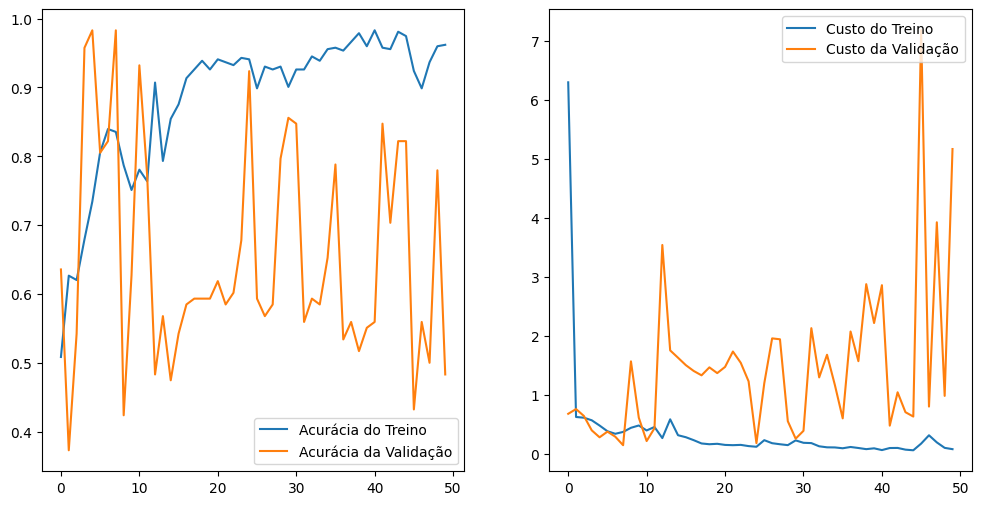

In [39]:
plota_resultados(history, epocas)

In [40]:
modelo.save('/content/drive/MyDrive/TCC/tcc-Modelos-treinados/modelo_apos_aumento.h5')


In [41]:
input_shape = (256,256,3)

In [42]:
  modelo_base = tf.keras.applications.InceptionV3(input_shape=input_shape, include_top=False, weights='imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [43]:
 modelo_base.trainable = False

In [44]:
  modelo_base.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 127, 127,  │        864 │ input_layer_6[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 127, 127,  │         96 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 127, 127,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 125, 125,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │         96 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 125, 125,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │        192 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 62, 62,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 62, 62,    │      5,120 │ max_pooling2d_8[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 62, 62,    │        240 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 62, 62,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 60, 60,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │        576 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 60, 60,    │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

In [45]:
# O código que rodaria SEM erro:
rescaling = tf.keras.layers.Rescaling(1./255)
treino = treino.map(lambda x, y: (rescaling(x), y))    # <--- CORRIGIDO
validacao = validacao.map(lambda x, y: (rescaling(x), y)) # <--- CORRIGIDO

In [46]:
ultima_camada = modelo_base.get_layer('mixed10')
print('ultima_camada', ultima_camada.output)
ultima_saida = ultima_camada.output

ultima_camada <KerasTensor shape=(None, 6, 6, 2048), dtype=float32, sparse=False, ragged=False, name=keras_tensor_356>


In [47]:
x = tf.keras.layers.Flatten()(ultima_saida)

x = tf.keras.layers.Dense(1024, activation='relu')(x)

x = tf.keras.layers.Dropout(0.2)(x)

x = tf.keras.layers.Dense(2, activation='softmax')(x)

modelo = tf.keras.Model(inputs=modelo_base.input,outputs=x)

In [48]:
modelo.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 127, 127,  │        864 │ input_layer_6[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 127, 127,  │         96 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 127, 127,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 125, 125,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │         96 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 125, 125,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │        192 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 62, 62,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 62, 62,    │      5,120 │ max_pooling2d_8[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 62, 62,    │        240 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 62, 62,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 60, 60,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │        576 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 60, 60,    │          0 │ batch_normalizat

 Total params: 97,303,330 (371.18 MB)

 Trainable params: 75,500,546 (288.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [49]:
modelo.compile(optimizer = tf.keras.optimizers.Adam(),
                    loss = 'sparse_categorical_crossentropy',
                    metrics=['accuracy'])

In [50]:
epocas = 20

history = modelo.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
)

Epoch 1/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 62s 5s/step - accuracy: 0.5184 - loss: 36.7774 - val_accuracy: 0.6780 - val_loss: 13.0433
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.8205 - loss: 5.5735 - val_accuracy: 0.8559 - val_loss: 2.7190
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9503 - loss: 1.0542 - val_accuracy: 0.9831 - val_loss: 0.6178
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9846 - loss: 0.1886 - val_accuracy: 0.9915 - val_loss: 0.2486
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9995 - loss: 0.0041 - val_accuracy: 0.9915 - val_loss: 0.1405
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9976 - loss: 0.0047 - val_accuracy: 0.9915 - val_loss: 0.2102
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 1.0000 - loss: 6.9465e-08 - val_accuracy: 0.9915 - val_loss: 0.2311
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9950 - loss: 0.0347 - val_accuracy: 0.9915 - val_loss: 0.1698
Ep

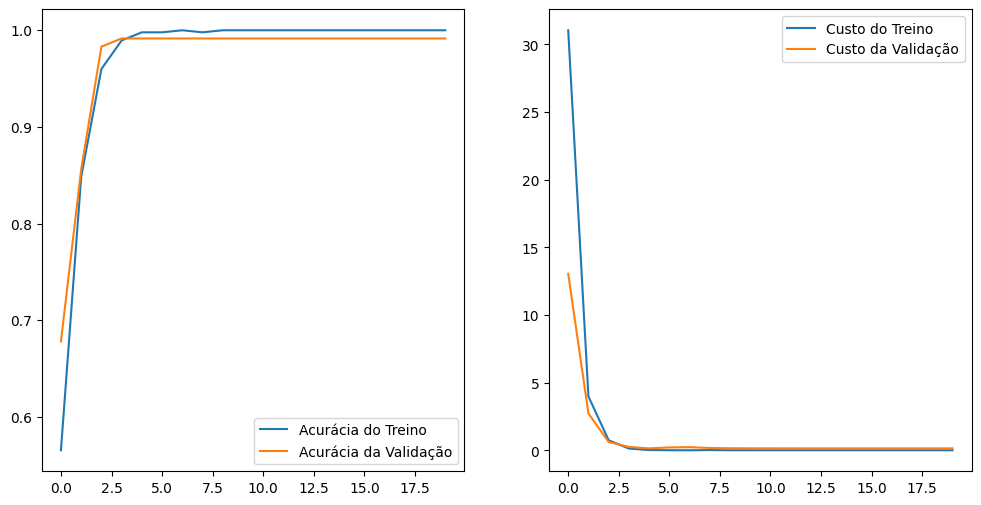

In [51]:
plota_resultados(history, epocas)

In [52]:
import tensorflow as tf

# --- PARTES QUE VOCÊ JÁ TEM PRONTAS ---
# treino (carregado)
# validacao (carregado)
# modelo_base (carregado e congelado)
# -------------------------------------

# 1. Defina a entrada
input_tensor = tf.keras.layers.Input(shape=(256, 256, 3))

# 2. Adicione a aumentação de dados que já criamos
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.05),
    tf.keras.layers.RandomZoom(0.05)
], name="data_augmentation")

x = data_augmentation(input_tensor)

# 3. Adicione a camada de pré-processamento CORRETA da InceptionV3
# (Ela converte pixels de [0, 255] para [-1, 1])
x = tf.keras.applications.inception_v3.preprocess_input(x)

# 4. REUTILIZE o modelo_base (ele já está na memória)
# 'training=False' é crucial para as camadas BatchNormalization
base_output = modelo_base(x, training=False)

# 5. 🚨 A SOLUÇÃO: Troque o Flatten() de 75M de parâmetros...
# x = tf.keras.layers.Flatten()(base_output)
# ...por GlobalAveragePooling2D()
x = tf.keras.layers.GlobalAveragePooling2D()(base_output)

# 6. Mantenha o restante da sua arquitetura
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
output_tensor = tf.keras.layers.Dense(2, activation='softmax')(x)

# 7. Crie o modelo final
modelo_corrigido = tf.keras.Model(inputs=input_tensor, outputs=output_tensor)

# 8. Compile o modelo
modelo_corrigido.compile(optimizer = tf.keras.optimizers.Adam(),
                       loss = 'sparse_categorical_crossentropy',
                       metrics=['accuracy'])

# 9. Verifique o NOVO summary (veja como os parâmetros treináveis são menores)
print("--- ARQUITETURA CORRIGIDA ---")
modelo_corrigido.summary()

# 10. Vamos treinar!
epocas = 20
print("\n--- INICIANDO TREINAMENTO CORRIGIDO ---")
history_corrigido = modelo_corrigido.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
)

--- ARQUITETURA CORRIGIDA ---


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 6, 6, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 2)              │         2,050 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,903,010 (91.18 MB)

 Trainable params: 2,100,226 (8.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)


--- INICIANDO TREINAMENTO CORRIGIDO ---
Epoch 1/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - accuracy: 0.5251 - loss: 1.3179 - val_accuracy: 0.6610 - val_loss: 0.6078
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.5192 - loss: 0.7539 - val_accuracy: 0.6356 - val_loss: 0.6977
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6462 - loss: 0.6331 - val_accuracy: 0.6780 - val_loss: 0.5841
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.6890 - loss: 0.5979 - val_accuracy: 0.6441 - val_loss: 0.5783
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.6369 - loss: 0.5584 - val_accuracy: 0.6864 - val_loss: 0.5368
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.6930 - loss: 0.5551 - val_accuracy: 0.7288 - val_loss: 0.5273
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.7208 - loss: 0.5257 - val_accuracy: 0.6780 - val_loss: 0.5292
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7333 - loss: 0.5127 - val_acc

In [53]:
# 1. Definir a entrada e aumentação (como antes)
# (Ele vai reutilizar o 'data_augmentation' que você já criou)
input_tensor = tf.keras.layers.Input(shape=(256, 256, 3))
x = data_augmentation(input_tensor)
x = tf.keras.applications.inception_v3.preprocess_input(x)

# 2. Reutilizar o modelo_base (como antes)
# (Ele vai reutilizar o 'modelo_base' que você já carregou)
base_output = modelo_base(x, training=False)

# 3. Usar GlobalAveragePooling (como antes)
x = tf.keras.layers.GlobalAveragePooling2D()(base_output)

# 4. 🚨 A MUDANÇA 🚨
# Conectamos o GlobalAveragePooling (que tem 2048 neurônios)
# DIRETAMENTE na camada de saída.
# Removemos a camada Dense(1024) que tinha 2.1M de parâmetros.

output_tensor = tf.keras.layers.Dense(2, activation='softmax')(x)

# 5. Criar e compilar o modelo final e leve
modelo_final_leve = tf.keras.Model(inputs=input_tensor, outputs=output_tensor)

modelo_final_leve.compile(optimizer=tf.keras.optimizers.Adam(),
                           loss='sparse_categorical_crossentropy',
                           metrics=['accuracy'])

# 6. Verifique o novo summary (deve mostrar ~4k parâmetros treináveis)
print("--- ARQUITETURA FINAL LEVE ---")
modelo_final_leve.summary()

# 7. Vamos treinar este novo modelo
epocas = 30 # Vamos treinar por 30 épocas, já que o modelo é leve
print("\n--- INICIANDO TREINAMENTO FINAL ---")
history_final_leve = modelo_final_leve.fit(
    treino,
    validation_data=validacao,
    epochs=epocas,
)

--- ARQUITETURA FINAL LEVE ---


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 6, 6, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 2)              │         4,098 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,806,882 (83.19 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 21,802,784 (83.17 MB)


--- INICIANDO TREINAMENTO FINAL ---
Epoch 1/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.6310 - loss: 0.6565 - val_accuracy: 0.6356 - val_loss: 0.6214
Epoch 2/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.6213 - loss: 0.6304 - val_accuracy: 0.6356 - val_loss: 0.6011
Epoch 3/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.6507 - loss: 0.5948 - val_accuracy: 0.6610 - val_loss: 0.5840
Epoch 4/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6682 - loss: 0.5850 - val_accuracy: 0.6610 - val_loss: 0.5719
Epoch 5/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.6584 - loss: 0.5651 - val_accuracy: 0.6525 - val_loss: 0.5604
Epoch 6/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.7015 - loss: 0.5555 - val_accuracy: 0.6780 - val_loss: 0.5581
Epoch 7/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6739 - loss: 0.5666 - val_accuracy: 0.6780 - val_loss: 0.5461
Epoch 8/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.7399 - loss: 0.5242 - val_accurac

In [ ]:
# --- 1. RECARREGAR OS DADOS (AGORA DA FORMA CORRETA) ---
# Vamos criar novos datasets sem o .map() de rescaling.
# Os pixels agora estarão no formato [0, 255], que é o que a InceptionV3 espera.

print("Recarregando datasets sem rescaling...")
treino_novo = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset = 'training',
    seed = 568, # Usar a mesma seed para consistência
    image_size=(altura, largura),
    batch_size=batch_size
)

validacao_novo = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset = 'validation',
    seed = 568, # Usar a mesma seed
    image_size=(altura, largura),
    batch_size=batch_size
)

# Otimizar a performance (bom para I/O)
treino_novo = treino_novo.prefetch(buffer_size=tf.data.AUTOTUNE)
validacao_novo = validacao_novo.prefetch(buffer_size=tf.data.AUTOTUNE)

print("Datasets recarregados!")


# --- 2. REDEFINIR E COMPILAR O MODELO FINAL LEVE ---
# (Vamos recriar o modelo 'modelo_final_leve' para garantir)

# A 'data_augmentation' e 'modelo_base' já estão na memória

input_tensor = tf.keras.layers.Input(shape=(256, 256, 3))

# Camada 1: Aumentação
x = data_augmentation(input_tensor)

# Camada 2: Pré-processamento (agora recebe [0, 255] e converte para [-1, 1])
x = tf.keras.applications.inception_v3.preprocess_input(x)

# Camada 3: Modelo base congelado
base_output = modelo_base(x, training=False)

# Camada 4: Pooling
x = tf.keras.layers.GlobalAveragePooling2D()(base_output)

# Camada 5: Saída
output_tensor = tf.keras.layers.Dense(2, activation='softmax')(x)

# Criar o modelo
modelo_pipeline_correta = tf.keras.Model(inputs=input_tensor, outputs=output_tensor)

modelo_pipeline_correta.compile(optimizer=tf.keras.optimizers.Adam(), # Adam com lr padrão
                           loss='sparse_categorical_crossentropy',
                           metrics=['accuracy'])

print("\n--- ARQUITETURA FINAL (COM 4K PARAMS) ---")
modelo_pipeline_correta.summary()


# --- 3. TREINAR O MODELO COM OS DADOS CORRETOS ---
epocas = 30
print("\n--- INICIANDO TREINAMENTO COM A PIPELINE CORRETA ---")
history_pipeline_correta = modelo_pipeline_correta.fit(
    treino_novo, # USANDO O NOVO DATASET
    validation_data=validacao_novo, # USANDO O NOVO DATASET
    epochs=epocas,
)

Recarregando datasets sem rescaling...
Found 592 files belonging to 2 classes.
Using 474 files for training.
Found 592 files belonging to 2 classes.
Using 118 files for validation.
Datasets recarregados!

--- ARQUITETURA FINAL (COM 4K PARAMS) ---


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 6, 6, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 2)              │         4,098 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,806,882 (83.19 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 21,802,784 (83.17 MB)


--- INICIANDO TREINAMENTO COM A PIPELINE CORRETA ---
Epoch 1/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.7843 - loss: 0.4808 - val_accuracy: 0.9237 - val_loss: 0.3132
Epoch 2/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.8929 - loss: 0.3119 - val_accuracy: 0.9407 - val_loss: 0.2272
Epoch 3/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9423 - loss: 0.2180 - val_accuracy: 0.9576 - val_loss: 0.1507
Epoch 4/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9764 - loss: 0.1623 - val_accuracy: 0.9831 - val_loss: 0.1187
Epoch 5/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9783 - loss: 0.1319 - val_accuracy: 0.9831 - val_loss: 0.1038
Epoch 6/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9951 - loss: 0.1064 - val_accuracy: 1.0000 - val_loss: 0.0861
Epoch 7/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9912 - loss: 0.0878 - val_accuracy: 1.0000 - val_loss: 0.0786
Epoch 8/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9960 - loss: 0.0

In [ ]:
# Use a sua função de plotagem com o novo histórico
plota_resultados(history_pipeline_correta, epocas)

In [ ]:
modelo.save('/content/drive/MyDrive/TCC/tcc-Modelos-treinados/transferencia_de_aprendizado.h5')

In [ ]:
modelo.save('/content/drive/MyDrive/TCC/tcc-Modelos-treinados/modelo_final_transferencia_de_aprendizado.h5', include_optimizer=False)

In [58]:
converter = tf.lite.TFLiteConverter.from_keras_model(modelo)

In [ ]:
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]

In [62]:
modelo_tflite_quantizado = converter.convert()

Saved artifact at '/tmp/tmpbr0re731'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor_46')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  133541540032592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834371664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834371280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834369360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834369552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834372240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834367824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834368592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834364368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133539834369936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13353983436

In [65]:
# 1. Defina o caminho completo, incluindo o nome do arquivo final
path_para_salvar = '/content/drive/MyDrive/TCC/tcc-Modelos-treinados/modelo_quantizado_float16.tflite'

# 2. Salve o modelo TFLite como um arquivo binário (usando 'wb' - write binary)
with open(path_para_salvar, 'wb') as f:
  f.write(modelo_tflite_quantizado)